### Machine learning Explainability approaches 

This notebook uses Kaggle's House Prices: Advanced regression (https://www.kaggle.com/c/house-prices-advanced-regression-techniques) techniques to apply different explainability methods. 

The following will be explored: 

- LIME
- Shapley values

.... later:  
    - Anchors
    - Data Shapley 
    
 Refer to other notebooks for the respective approaches there.

### LIME 

Local interpretable mogel agnostic eplanations (LIME) works with tabular data, text and images. It works for classification and prediction problems, and provides explanations on an instance level.

LIME works in the following way:1)generates a new dataset of permuted samples and calculates the predictions using the blac box model; 2) trains an interpretable model on the new dataset, weighted by the proximity of the sampled instance to the instance of interest. With tabular data, LIME samples are taken from the training data's mass center.

The interpretation could be a good LOCAL appoximation of the model, but not necessarily a global one. 

**Advantages**:
- You can replace the black box model and still use the same local interpretable model
- Can provide short, human-friendly explanations
- The explanations can use other features than the features in the model itself


**Disadvantages**:
- Defintiion of the neighborhood is still an unsolved problem (best you can do is try different kernel settings and test which one works best)
- Sampling could be improved (currently sampling from a Gaussian distribution)
- Correlation between features ignored, so sometimes impossible values

In [190]:
import lime
from lime.lime_tabular import LimeTabularExplainer

# create the explainer by passing our training data, 
# pass in feature names as a list
# make sure we don't discretize the continuous features
# and can play with the kernel_wodth

explainer = LimeTabularExplainer(X, mode='regression', 
                                 feature_names=list(X.columns), 
                                 random_state=42, 
                                 discretize_continuous=False,
                                 kernel_width=1) 

Note that the local explaination is not dependent on the black box model (we did not specify it anywhere). 

In [191]:
# Generate explanations for the i-th row in the dataset: change the X.loc[] to change which row you select
# Can also select the number of features to use for that explanation, given by num_features

exp = explainer.explain_instance(X.iloc[0,:].values, 
                                 rf.predict, num_features=10)

In [192]:
# Now that we have the prediction, we can start exploring it: first see that concrete value
# the prediction made by the local surrogate model

exp.local_pred[0]

205934.4

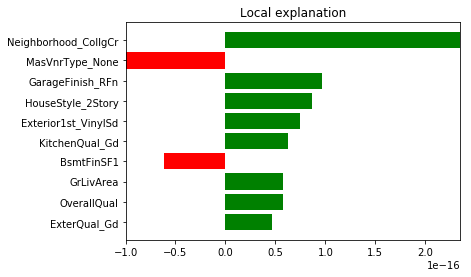

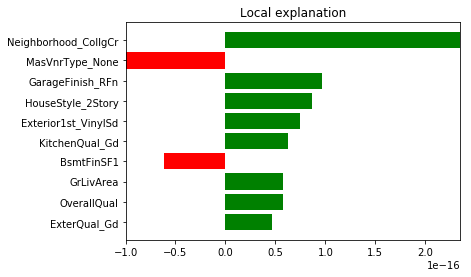

In [193]:
exp.as_pyplot_figure()

# Not sure why it plots the same figure twice... 

In [194]:
# a plot of the weights for each feature

exp.show_in_notebook()

### Shapley

Shapley values are wonderful! They come from cooperative game theory, where in order to calculate the marginal contribution of a player to the total utility in a game, you form all possible coalitions (also varying the entrance order of players to coalitions). Here we do not have players but features, and we do not have a game but a model. 

The Shapley value gives us the marginal contribution of a feature (on an instance level). It works for both classification and regression tasks, and can be used with tabular data, text and images. 

**Advantages:**
- They have a solid theoretical foundation, and inherit the properties of Shapley values in game theory. One of these properties is efficiency (ensures that the difference between the prediction and the average prediction is fairly distributed between the features).
- Can work in compliance settings because it uses all of the features and works on an instance level

**Disadvantages**:
- Compute time increases with the number of features
- Can be misinterpreted: Shapley value is NOT the difference in the model prediction after removing that one feature, but given the current features, the contribution of a feature value to the difference between the actual prediction and the mean prediction is the Shapley value for that feature

In [195]:
import shap

# load JS visualization code to notebook
shap.initjs()

In [43]:
# explain the model's predictions using SHAP values
# This is the part that can take a while to compute with larger datasets

explainer = shap.TreeExplainer(rf)
shap_values = explainer.shap_values(X)

We can look at the Shapley value for one instance. We see how each feature's contribution is pushing the model's output from the base value to the model output for the concrete instance. In red are features that increase the contribution, and in blue- are those that decrease. We see the concrete values of the features for that one instance (below), and their contribution. 

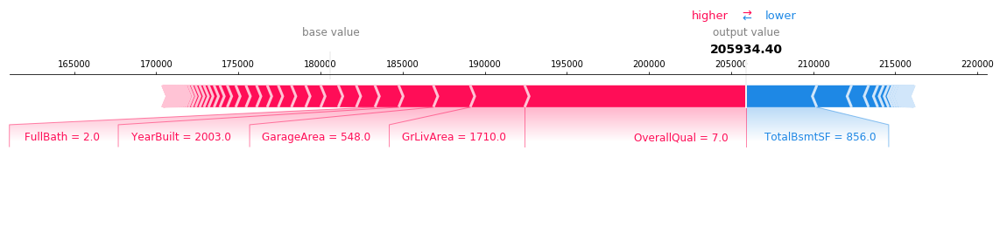

In [44]:
# visualize the first prediction's explanation (use matplotlib=True to avoid Javascript)
shap.force_plot(explainer.expected_value, shap_values[0,:], X.iloc[0,:], matplotlib=True)

In [45]:
# visualize the training set predictions
# This plot shows for all the samples in the data, their predictions and Shapley values. It is like the plot above 
# (Shapley value for a single instance) but aggregated for the whole data set. 
shap.force_plot(explainer.expected_value, shap_values, X)

We can also plot the Shap values of a single feature vs. the value of the feature for all examples in the data set.
The function automatically selects one feature to interact it with. In this case, it has selected the GrLivArea. In this case, the coloring reveals that the average quality of a house has more impact on houses with a high GrLivArea.

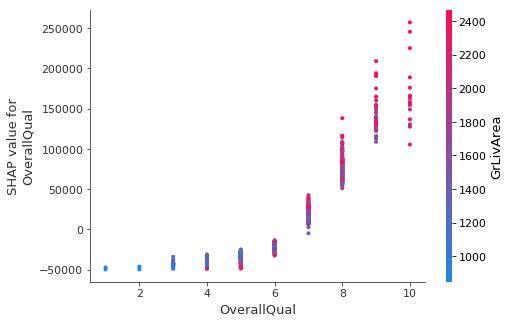

In [46]:
# create a SHAP dependence plot to show the effect of a single feature across the whole dataset
shap.dependence_plot("OverallQual", shap_values, X)

The plot below shows the Shapley values for all the features and all instances in the dataset. It sorts features but the sum of the Shap value magnitudes over all samples, and shows the impact each feature has on the model output. 

Red color means high values, blue color means low value. The plot reveals, for example, that a high overall quality increases the predicted sale price.

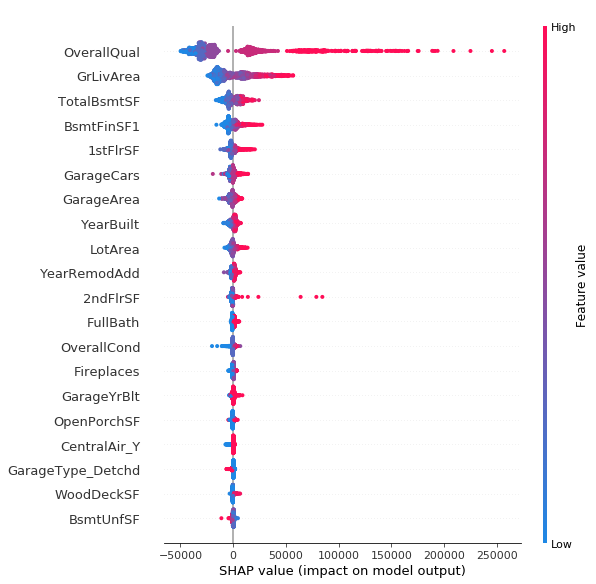

In [47]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X)

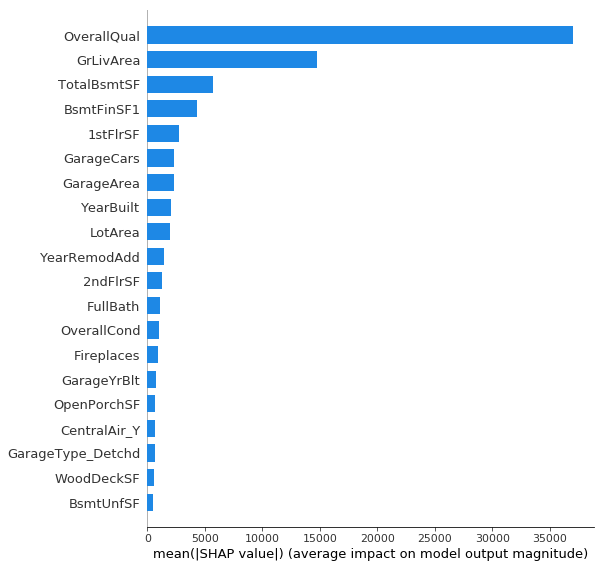

In [48]:
# Plot the features'average impact on the model output's magnitude
shap.summary_plot(shap_values, X, plot_type="bar")